# Feature Selection

We use XGBoost to explore our data and determine if there are features that might be considered "more important" to include in our NeuralProphet, XGBoost + Prophet, and XGBoost models. This narrows down our list of regressed features we might consider for NeuralProphet.

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime

from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from sklearn.linear_model import LinearRegression

from prophet import Prophet
from pandas.tseries.holiday import USFederalHolidayCalendar
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.plot import plot_cross_validation_metric
from prophet.plot import add_changepoints_to_plot
import itertools

import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)

import xgboost as xgb
from xgboost import plot_importance


The XGBoost model requires a bit more preparatory work. Our current dataframe rs is quite bare. We will need to add features for use.

In [23]:
# this is the time series split we will work with
tscv = TimeSeriesSplit(gap=0, max_train_size=None, n_splits=26, test_size=14)


# we import the data and clean it for future use
rs = pd.read_csv('../data/cleaned_rat_sightings_data/all_cleaned_rat_sightings.csv')
rs['created_date'] = pd.to_datetime(rs['created_date']) 
# mark cutoff dates, and also rename columns
rs = rs[rs['created_date']<'2025-03-01']
rs = rs[rs['created_date']>='2020-01-01']
rs = rs.groupby([rs['created_date'].dt.date]).size().reset_index(name='count')
rs.rename(columns={'created_date': 'ds', 'count': 'y'}, inplace=True)

### Adding Features to XGBoost

In [24]:
def create_features(df):
    # create time series features based on time series index.
    df = df.copy()
    df['dayofweek'] = df.index.dayofweek
    df['quarter'] = df.index.quarter
    df['month'] = df.index.month
    df['year'] = df.index.year
    df['dayofyear'] = df.index.dayofyear
    df['dayofmonth'] = df.index.day
    df['weekofyear'] = df.index.isocalendar().week
    return df

def add_cyclic(df):
    # features to handly cyclic behavior
    target_map = df['y'].to_dict()
    df['dayofweek_sin'] = np.sin(2 * np.pi * df['dayofweek']/7)
    df['dayofweek_cos'] = np.cos(2 * np.pi * df['dayofweek']/7)
    df['month_sin'] = np.sin(2 * np.pi * df['month']/12)
    df['month_cos'] = np.cos(2 * np.pi * df['month']/12)
    return df

def add_lags(df):
    # lags
    target_map = df['y'].to_dict()
    df['lag15'] = (df.index - pd.Timedelta('15 days')).map(target_map)
    df['lag16'] = (df.index - pd.Timedelta('16 days')).map(target_map)
    return df

def add_seasonal_lags(df):
    # lags of various lengths for different levels of seasonality
    target_map = df['y'].to_dict()
    df['lag30'] = (df.index - pd.Timedelta('30 days')).map(target_map)
    df['lag60'] = (df.index - pd.Timedelta('60 days')).map(target_map)
    df['lag90'] = (df.index - pd.Timedelta('90 days')).map(target_map)
    df['lag120'] = (df.index - pd.Timedelta('120 days')).map(target_map)
    df['lag150'] = (df.index - pd.Timedelta('150 days')).map(target_map)
    df['lag180'] = (df.index - pd.Timedelta('180 days')).map(target_map)

    df['lag362'] = (df.index - pd.Timedelta('365 days')).map(target_map)
    df['lag363'] = (df.index - pd.Timedelta('365 days')).map(target_map)
    df['lag364'] = (df.index - pd.Timedelta('365 days')).map(target_map)
    df['lag365'] = (df.index - pd.Timedelta('365 days')).map(target_map)
    df['lag366'] = (df.index - pd.Timedelta('365 days')).map(target_map)
    df['lag367'] = (df.index - pd.Timedelta('365 days')).map(target_map)
    
    df['lag730'] = (df.index - pd.Timedelta('730 days')).map(target_map)
    df['lag1095'] = (df.index - pd.Timedelta('1095 days')).map(target_map)
    df['lag1460'] = (df.index - pd.Timedelta('1460 days')).map(target_map)
    df['lag1825'] = (df.index - pd.Timedelta('1825 days')).map(target_map)
    return df

def add_moving_averages(df):
    df = df.copy()
    df = df.sort_index()
    
    # Moving averages (using previous values only)
    # Must shift by 14 days because we do not want to let there be temporal leakage in our evaluations
    df['ma7'] = df['y'].shift(14).rolling(window=7).mean()
    df['ma30'] = df['y'].shift(14).rolling(window=30).mean()
    df['ma60'] = df['y'].shift(14).rolling(window=60).mean()
    df['ma90'] = df['y'].shift(14).rolling(window=90).mean()
    df['ma120'] = df['y'].shift(14).rolling(window=120).mean()
    df['ma150'] = df['y'].shift(14).rolling(window=150).mean()
    df['ma180'] = df['y'].shift(14).rolling(window=180).mean()
    df['ma365'] = df['y'].shift(14).rolling(window=365).mean()
    
    return df


In the next two code block, we add weather data to the data set. This is not optimized i.e. we just obtain the weather data in Manhattan and hope that it is representative of the average weather over the whole city.

In [25]:
## Add weather data.

import requests
import pandas as pd

lat, lon = 40.7831, -73.9712
start = "2020-01-01"
end   = "2025-02-28"

url = (
    "https://archive-api.open-meteo.com/v1/archive"
    f"?latitude={lat}&longitude={lon}"
    f"&start_date={start}&end_date={end}"
    "&daily=temperature_2m_max,temperature_2m_min,temperature_2m_mean,"
    "apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,"
    "precipitation_sum,snowfall_sum"
    "&timezone=America/New_York"
)

response = requests.get(url)
data = response.json()

if 'error' in data:
    nd = pd.read_csv("weatherdata.csv")
    nd = nd.set_index('date')
    wd = nd
    
else:
    wd = pd.DataFrame(data["daily"])
    wd["date"] = pd.to_datetime(wd["time"])
    wd = wd.set_index("date")

In [26]:
def add_weather_data(df, wd):
    df = df.copy()
    wd = wd.copy()
    
    # Ensure datetime index
    df.index = pd.to_datetime(df.index)
    wd.index = pd.to_datetime(wd.index)
    
    # Drop unnecessary columns
    if "time" in wd.columns:
        wd = wd.drop(columns=["time"])
    
    # Remove overlapping columns to avoid join errors
    overlap = wd.columns.intersection(df.columns)
    wd = wd.drop(columns=overlap)
    
    # Join on date index
    df = df.join(wd, how="left")
    
    return df

def add_more_weather_feature(df):
    target_map = df['apparent_temperature_min'].to_dict()
    df['apparent_temperature_min_lag15'] = (df.index - pd.Timedelta('15 days')).map(target_map)
    df['apparent_temperature_min_lag16'] = (df.index - pd.Timedelta('16 days')).map(target_map)
    df['apparent_temperature_min_lag17'] = (df.index - pd.Timedelta('17 days')).map(target_map)
    df['apparent_temperature_min_lag18'] = (df.index - pd.Timedelta('18 days')).map(target_map)
    df['apparent_temperature_min_lag19'] = (df.index - pd.Timedelta('19 days')).map(target_map)
    df['apparent_temperature_min_lag20'] = (df.index - pd.Timedelta('20 days')).map(target_map)
    df['apparent_temperature_min_lag21'] = (df.index - pd.Timedelta('21 days')).map(target_map)

    df['apparent_temperature_min_lag30'] = (df.index - pd.Timedelta('30 days')).map(target_map)
    df['apparent_temperature_min_lag60'] = (df.index - pd.Timedelta('60 days')).map(target_map)
    df['apparent_temperature_min_lag90'] = (df.index - pd.Timedelta('90 days')).map(target_map)
    df['apparent_temperature_min_lag120'] = (df.index - pd.Timedelta('120 days')).map(target_map)
    df['apparent_temperature_min_lag150'] = (df.index - pd.Timedelta('150 days')).map(target_map)
    df['apparent_temperature_min_lag180'] = (df.index - pd.Timedelta('180 days')).map(target_map)
    df['apparent_temperature_min_lag210'] = (df.index - pd.Timedelta('210 days')).map(target_map)
    df['apparent_temperature_min_lag240'] = (df.index - pd.Timedelta('240 days')).map(target_map)
    df['apparent_temperature_min_lag270'] = (df.index - pd.Timedelta('270 days')).map(target_map)
    df['apparent_temperature_min_lag300'] = (df.index - pd.Timedelta('300 days')).map(target_map)
    df['apparent_temperature_min_lag330'] = (df.index - pd.Timedelta('330 days')).map(target_map)
    df['apparent_temperature_min_lag360'] = (df.index - pd.Timedelta('360 days')).map(target_map)
    df['apparent_temperature_min_lag365'] = (df.index - pd.Timedelta('365 days')).map(target_map)
    df['apparent_temperature_min_lag730'] = (df.index - pd.Timedelta('730 days')).map(target_map)

    target_map = df['temperature_2m_max'].to_dict()
    df['temperature_2m_max_lag14'] = (df.index - pd.Timedelta('14 days')).map(target_map)
    df['temperature_2m_max_lag30'] = (df.index - pd.Timedelta('30 days')).map(target_map)
    df['temperature_2m_max_lag60'] = (df.index - pd.Timedelta('60 days')).map(target_map)

    return df

def add_yearly_temp_diffs(df, horizon_days=14, years=[1,2,3,4]):
    df = df.copy()

    # Ensure datetime index
    df.index = pd.to_datetime(df.index)

    # Base shifted temps (outside forecast horizon)
    base_min = df['apparent_temperature_min'].shift(horizon_days)
    base_max = df['temperature_2m_max'].shift(horizon_days)

    for y in years:
        lag_days = 365 * y

        df[f'apparent_temperature_min_diff_{y}y'] = (
            base_min - df['apparent_temperature_min'].shift(horizon_days + lag_days)
        )

        df[f'temperature_2m_max_diff_{y}y'] = (
            base_max - df['temperature_2m_max'].shift(horizon_days + lag_days)
        )

    return df

In [27]:
from pandas.tseries.holiday import USFederalHolidayCalendar

def add_federal_holidays(df, custom_holidays=None):
    df = df.copy()
    
    # Ensure datetime index
    df.index = pd.to_datetime(df.index)
    
    cal = USFederalHolidayCalendar()
    holidays = cal.holidays(start=df.index.min(), end=df.index.max())
    
    if custom_holidays:
        for d in custom_holidays:
            if len(d) == 5:  # MM-DD format handling
                years = df.index.year.unique()
                for y in years:
                    holidays = holidays.append(pd.to_datetime([f"{y}-{d}"]))
            else:  # YYYY-MM-DD format handling
                holidays = holidays.append(pd.to_datetime([d]))
    
    holidays = holidays.drop_duplicates().sort_values()
    
    df["is_federal_holiday"] = df.index.isin(holidays).astype(int)
    
    return df

In [28]:
def add_law_flag(df, law_name: str, start_date: str):
    # Adds a binary column to indicate when a new law is active.
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    start_dt = pd.to_datetime(start_date)
    # Create binary column: 1 if date >= start_date, else 0
    df[law_name] = (df.index >= start_dt).astype(int)
    
    return df

In [29]:
rs = rs.set_index('ds')
rs.index = pd.to_datetime(rs.index)

In [30]:
rs = create_features(rs)
rs = add_cyclic(rs)
rs = add_lags(rs)
rs = add_seasonal_lags(rs)
rs = add_moving_averages(rs)
rs = add_weather_data(rs,wd)
rs = add_more_weather_feature(rs)
rs = add_federal_holidays(rs, custom_holidays = ['12-31'])
rs = add_law_flag(rs, law_name='Trash_Law', start_date = '2024-03-01')
rs = add_law_flag(rs, law_name = 'New_Trash_Law', start_date = '2024-11-01')
rs = add_law_flag(rs, law_name='Rat_Mitigation_Zone', start_date = '2023-07-07')
rs = add_law_flag(rs, law_name='Rat_Czar_Appointed', start_date = '2023-04-12')
rs = add_yearly_temp_diffs(rs)

rs.columns

Index(['y', 'dayofweek', 'quarter', 'month', 'year', 'dayofyear', 'dayofmonth',
       'weekofyear', 'dayofweek_sin', 'dayofweek_cos', 'month_sin',
       'month_cos', 'lag15', 'lag16', 'lag30', 'lag60', 'lag90', 'lag120',
       'lag150', 'lag180', 'lag362', 'lag363', 'lag364', 'lag365', 'lag366',
       'lag367', 'lag730', 'lag1095', 'lag1460', 'lag1825', 'ma7', 'ma30',
       'ma60', 'ma90', 'ma120', 'ma150', 'ma180', 'ma365',
       'temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean',
       'apparent_temperature_max', 'apparent_temperature_min',
       'apparent_temperature_mean', 'precipitation_sum', 'snowfall_sum',
       'apparent_temperature_min_lag15', 'apparent_temperature_min_lag16',
       'apparent_temperature_min_lag17', 'apparent_temperature_min_lag18',
       'apparent_temperature_min_lag19', 'apparent_temperature_min_lag20',
       'apparent_temperature_min_lag21', 'apparent_temperature_min_lag30',
       'apparent_temperature_min_lag60', 'apparent_tempe

## Features and Parameters for XGBoost

In [31]:
FEATURES = ['dayofweek', 'quarter', 'month', 'year', 'dayofyear', 'dayofmonth',
       'weekofyear', 'dayofweek_sin', 'dayofweek_cos', 'month_sin',
       'month_cos', 'lag15', 'lag16', 'lag30', 'lag60', 'lag90', 'lag120',
       'lag150', 'lag180', 'lag362', 'lag363', 'lag364', 'lag365', 'lag366',
       'lag367', 'lag730', 'lag1095', 'lag1460', 'lag1825', 'ma7', 'ma30',
       'ma60', 'ma90', 'ma120', 'ma150', 'ma180', 'ma365',
       'temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean',
       'apparent_temperature_max', 'apparent_temperature_min',
       'apparent_temperature_mean', 'precipitation_sum', 'snowfall_sum',
       'apparent_temperature_min_lag15',
       'apparent_temperature_min_lag16', 'apparent_temperature_min_lag17',
       'apparent_temperature_min_lag18', 'apparent_temperature_min_lag19',
       'apparent_temperature_min_lag20', 'apparent_temperature_min_lag21',
       'apparent_temperature_min_lag30', 'apparent_temperature_min_lag60',
       'apparent_temperature_min_lag90', 'apparent_temperature_min_lag120',
       'apparent_temperature_min_lag150', 'apparent_temperature_min_lag180',
       'apparent_temperature_min_lag210', 'apparent_temperature_min_lag240',
       'apparent_temperature_min_lag270', 'apparent_temperature_min_lag300',
       'apparent_temperature_min_lag330', 'apparent_temperature_min_lag360',
       'apparent_temperature_min_lag365', 'apparent_temperature_min_lag730',
       'temperature_2m_max_lag14', 'temperature_2m_max_lag30',
       'temperature_2m_max_lag60', 'is_federal_holiday', 'Trash_Law',
       'New_Trash_Law', 'Rat_Mitigation_Zone', 'Rat_Czar_Appointed', 'apparent_temperature_min_diff_1y', 'temperature_2m_max_diff_1y',
       'apparent_temperature_min_diff_2y', 'temperature_2m_max_diff_2y',
       'apparent_temperature_min_diff_3y', 'temperature_2m_max_diff_3y',
       'apparent_temperature_min_diff_4y', 'temperature_2m_max_diff_4y']

In [32]:
params = {'objective': 'reg:squarederror',
         'eval_metric': 'rmse',
         'booster': 'gbtree',
         'base_score': 0.5, 
         'n_estimators': 5000, 
        #  'min_child_weight': 6, 
        # 'learning_rate': 0.001,
        # 'max_depth': 6, 
        # 'subsample': 1,
        # 'colsample_bytree': 0.96,
        # 'colsample_bylevel': 0.6, 
        # 'colsample_bynode': 0.9, 
        # 'reg_alpha': 2.2, 
        # 'gamma': 100, 
        # 'reg_lambda': 0.18,
        #  'early_stopping_rounds': 100, 
        }

## Feature Importance From XGBoost

In [33]:
# print(FEATURES)
# print(params)
TARGET = 'y'

# Gotta make sure the features and parameters exist.

xgb_model = xgb.XGBRegressor(**params)
xgb_model.fit(rs[FEATURES],rs[TARGET])

,objective,'reg:squarederror'
,base_score,0.5
,booster,'gbtree'
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,None
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,'rmse'


Text(0.5, 1.0, 'Total Cover Importance')

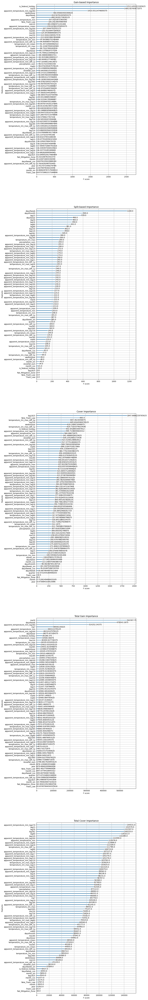

In [34]:
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(10, 100))
plot_importance(xgb_model, ax=ax1, importance_type='gain')
ax1.set_title('Gain-based Importance', fontsize=12)

plot_importance(xgb_model, ax=ax2, importance_type='weight')
ax2.set_title('Split-based Importance', fontsize=12)

plot_importance(xgb_model, ax=ax3, importance_type='cover')
ax3.set_title('Cover Importance', fontsize=12)

plot_importance(xgb_model, ax=ax4, importance_type='total_gain')
ax4.set_title('Total Gain Importance', fontsize=12)

plot_importance(xgb_model, ax=ax5, importance_type='total_cover')
ax5.set_title('Total Cover Importance', fontsize=12)

## Trial 2

Text(0.5, 1.0, 'Total Cover Importance')

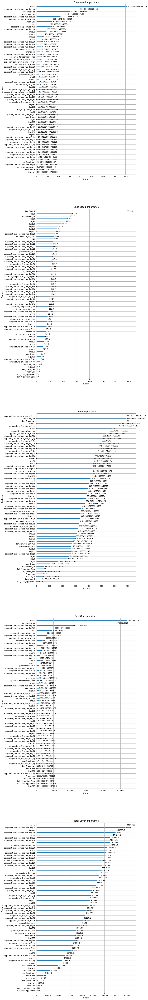

In [35]:
FEATURES = ['dayofmonth', 'dayofweek_sin', 'dayofweek_cos', 'month_sin',
       'month_cos', 'lag30', 'lag60', 'lag90', 'lag120',
       'lag150', 'lag180', 'lag362', 'lag363', 'lag364', 'lag365', 'lag366',
       'lag367', 'lag730', 'lag1095', 'lag1460', 'lag1825', 'ma7', 'ma30',
       'ma60', 'ma90', 'ma120', 'ma150', 'ma180', 'ma365',
       'temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean',
       'apparent_temperature_max', 'apparent_temperature_min',
       'apparent_temperature_mean', 'precipitation_sum', 'snowfall_sum',
       'apparent_temperature_min_lag15',
       'apparent_temperature_min_lag16', 'apparent_temperature_min_lag17',
       'apparent_temperature_min_lag18', 'apparent_temperature_min_lag19',
       'apparent_temperature_min_lag20', 'apparent_temperature_min_lag21',
       'apparent_temperature_min_lag30', 'apparent_temperature_min_lag60',
       'apparent_temperature_min_lag90', 'apparent_temperature_min_lag120',
       'apparent_temperature_min_lag150', 'apparent_temperature_min_lag180',
       'apparent_temperature_min_lag210', 'apparent_temperature_min_lag240',
       'apparent_temperature_min_lag270', 'apparent_temperature_min_lag300',
       'apparent_temperature_min_lag330', 'apparent_temperature_min_lag360',
       'apparent_temperature_min_lag365', 'apparent_temperature_min_lag730',
       'temperature_2m_max_lag30',
       'temperature_2m_max_lag60', 'Trash_Law',
       'New_Trash_Law', 'Rat_Mitigation_Zone', 'Rat_Czar_Appointed', 'apparent_temperature_min_diff_1y', 'temperature_2m_max_diff_1y',
       'apparent_temperature_min_diff_2y', 'temperature_2m_max_diff_2y',
       'apparent_temperature_min_diff_3y', 'temperature_2m_max_diff_3y',
       'apparent_temperature_min_diff_4y', 'temperature_2m_max_diff_4y']

params = {'objective': 'reg:squarederror',
         'eval_metric': 'rmse',
         'booster': 'gbtree',
         'base_score': 0.5, 
         'n_estimators': 5000, 
        #  'min_child_weight': 6, 
        # 'learning_rate': 0.001,a
        # 'max_depth': 6, 
        # 'subsample': 1,
        # 'colsample_bytree': 0.96,
        # 'colsample_bylevel': 0.6, 
        # 'colsample_bynode': 0.9, 
        # 'reg_alpha': 2.2, 
        # 'gamma': 100, 
        # 'reg_lambda': 0.18,
        #  'early_stopping_rounds': 100, 
        }

# print(FEATURES)
# print(params)
TARGET = 'y'

# Gotta make sure the features and parameters exist.

xgb_model = xgb.XGBRegressor(**params)
xgb_model.fit(rs[FEATURES],rs[TARGET])

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(10, 100))
plot_importance(xgb_model, ax=ax1, importance_type='gain')
ax1.set_title('Gain-based Importance', fontsize=12)

plot_importance(xgb_model, ax=ax2, importance_type='weight')
ax2.set_title('Split-based Importance', fontsize=12)

plot_importance(xgb_model, ax=ax3, importance_type='cover')
ax3.set_title('Cover Importance', fontsize=12)

plot_importance(xgb_model, ax=ax4, importance_type='total_gain')
ax4.set_title('Total Gain Importance', fontsize=12)

plot_importance(xgb_model, ax=ax5, importance_type='total_cover')
ax5.set_title('Total Cover Importance', fontsize=12)

## Trial 3

Text(0.5, 1.0, 'Total Cover Importance')

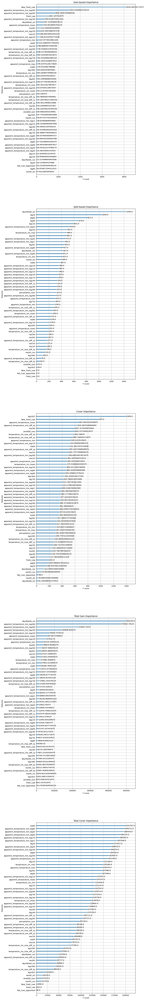

In [36]:
FEATURES = ['dayofweek_sin', 'dayofweek_cos', 'month_sin',
       'month_cos', 'lag30', 'lag60', 'lag90', 'lag120',
       'lag150', 'lag180', 'lag362', 'lag363', 'lag364', 'lag365', 'lag366',
       'lag367', 'lag730', 'lag1095', 'lag1460', 'lag1825',
       'ma60', 'ma90', 'ma120', 'ma150', 'ma180', 'ma365',
       'temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean',
       'apparent_temperature_max', 'apparent_temperature_min',
       'apparent_temperature_mean', 'precipitation_sum', 'snowfall_sum',
       'apparent_temperature_min_lag20', 'apparent_temperature_min_lag21',
       'apparent_temperature_min_lag30', 'apparent_temperature_min_lag60',
       'apparent_temperature_min_lag90', 'apparent_temperature_min_lag120',
       'apparent_temperature_min_lag150', 'apparent_temperature_min_lag180',
       'apparent_temperature_min_lag210', 'apparent_temperature_min_lag240',
       'apparent_temperature_min_lag270', 'apparent_temperature_min_lag300',
       'apparent_temperature_min_lag330', 'apparent_temperature_min_lag360',
       'apparent_temperature_min_lag365', 'apparent_temperature_min_lag730',
       'Trash_Law',
       'New_Trash_Law', 'Rat_Mitigation_Zone', 'Rat_Czar_Appointed', 'apparent_temperature_min_diff_1y', 'temperature_2m_max_diff_1y',
       'apparent_temperature_min_diff_2y', 'temperature_2m_max_diff_2y',
       'apparent_temperature_min_diff_3y', 'temperature_2m_max_diff_3y',
       'apparent_temperature_min_diff_4y', 'temperature_2m_max_diff_4y']

params = {'objective': 'reg:squarederror',
         'eval_metric': 'rmse',
         'booster': 'gbtree',
         'base_score': 0.5, 
         'n_estimators': 5000, 
        #  'min_child_weight': 6, 
        # 'learning_rate': 0.001,a
        # 'max_depth': 6, 
        # 'subsample': 1,
        # 'colsample_bytree': 0.96,
        # 'colsample_bylevel': 0.6, 
        # 'colsample_bynode': 0.9, 
        # 'reg_alpha': 2.2, 
        # 'gamma': 100, 
        # 'reg_lambda': 0.18,
        #  'early_stopping_rounds': 100, 
        }

# print(FEATURES)
# print(params)
TARGET = 'y'

# Gotta make sure the features and parameters exist.

xgb_model = xgb.XGBRegressor(**params)
xgb_model.fit(rs[FEATURES],rs[TARGET])

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(10, 100))
plot_importance(xgb_model, ax=ax1, importance_type='gain')
ax1.set_title('Gain-based Importance', fontsize=12)

plot_importance(xgb_model, ax=ax2, importance_type='weight')
ax2.set_title('Split-based Importance', fontsize=12)

plot_importance(xgb_model, ax=ax3, importance_type='cover')
ax3.set_title('Cover Importance', fontsize=12)

plot_importance(xgb_model, ax=ax4, importance_type='total_gain')
ax4.set_title('Total Gain Importance', fontsize=12)

plot_importance(xgb_model, ax=ax5, importance_type='total_cover')
ax5.set_title('Total Cover Importance', fontsize=12)

## Trial 4

Text(0.5, 1.0, 'Total Cover Importance')

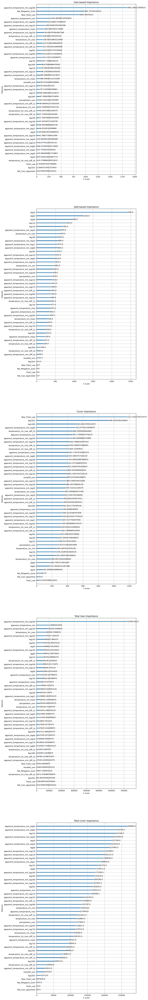

In [37]:
FEATURES = ['lag30', 'lag60', 'lag90', 'lag120',
       'lag150', 'lag180', 'lag362', 'lag363', 'lag364', 'lag365', 'lag366',
       'lag367', 'lag730', 'lag1095', 'lag1460', 'lag1825',
       'temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean',
       'apparent_temperature_max', 'apparent_temperature_min',
       'apparent_temperature_mean', 'precipitation_sum', 'snowfall_sum',
       'apparent_temperature_min_lag20', 'apparent_temperature_min_lag21',
       'apparent_temperature_min_lag30', 'apparent_temperature_min_lag60',
       'apparent_temperature_min_lag90', 'apparent_temperature_min_lag120',
       'apparent_temperature_min_lag150', 'apparent_temperature_min_lag180',
       'apparent_temperature_min_lag210', 'apparent_temperature_min_lag240',
       'apparent_temperature_min_lag270', 'apparent_temperature_min_lag300',
       'apparent_temperature_min_lag330', 'apparent_temperature_min_lag360',
       'apparent_temperature_min_lag365', 'apparent_temperature_min_lag730',
       'Trash_Law',
       'New_Trash_Law', 'Rat_Mitigation_Zone', 'Rat_Czar_Appointed', 'apparent_temperature_min_diff_1y', 'temperature_2m_max_diff_1y',
       'apparent_temperature_min_diff_2y', 'temperature_2m_max_diff_2y',
       'apparent_temperature_min_diff_3y', 'temperature_2m_max_diff_3y',
       'apparent_temperature_min_diff_4y', 'temperature_2m_max_diff_4y']

params = {'objective': 'reg:squarederror',
         'eval_metric': 'rmse',
         'booster': 'gbtree',
         'base_score': 0.5, 
         'n_estimators': 5000, 
        #  'min_child_weight': 6, 
        # 'learning_rate': 0.001,a
        # 'max_depth': 6, 
        # 'subsample': 1,
        # 'colsample_bytree': 0.96,
        # 'colsample_bylevel': 0.6, 
        # 'colsample_bynode': 0.9, 
        # 'reg_alpha': 2.2, 
        # 'gamma': 100, 
        # 'reg_lambda': 0.18,
        #  'early_stopping_rounds': 100, 
        }

# print(FEATURES)
# print(params)
TARGET = 'y'

# Gotta make sure the features and parameters exist.

xgb_model = xgb.XGBRegressor(**params)
xgb_model.fit(rs[FEATURES],rs[TARGET])

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(10, 100))
plot_importance(xgb_model, ax=ax1, importance_type='gain')
ax1.set_title('Gain-based Importance', fontsize=12)

plot_importance(xgb_model, ax=ax2, importance_type='weight')
ax2.set_title('Split-based Importance', fontsize=12)

plot_importance(xgb_model, ax=ax3, importance_type='cover')
ax3.set_title('Cover Importance', fontsize=12)

plot_importance(xgb_model, ax=ax4, importance_type='total_gain')
ax4.set_title('Total Gain Importance', fontsize=12)

plot_importance(xgb_model, ax=ax5, importance_type='total_cover')
ax5.set_title('Total Cover Importance', fontsize=12)

## Trial 5

Text(0.5, 1.0, 'Total Cover Importance')

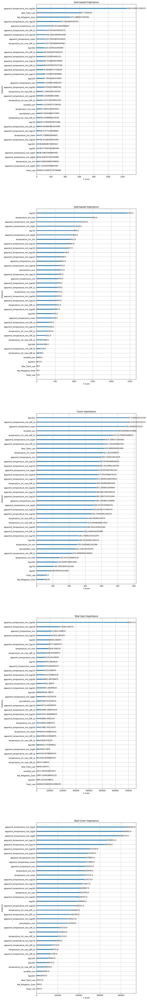

In [38]:
FEATURES = ['lag365', 'lag366',
       'lag367', 'lag730', 'lag1095', 'lag1460', 'lag1825',
       'temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean',
       'apparent_temperature_max', 'apparent_temperature_min',
       'apparent_temperature_mean', 'precipitation_sum', 'snowfall_sum',
       'apparent_temperature_min_lag30', 'apparent_temperature_min_lag60',
       'apparent_temperature_min_lag90', 'apparent_temperature_min_lag120',
       'apparent_temperature_min_lag150', 'apparent_temperature_min_lag180',
       'apparent_temperature_min_lag210', 'apparent_temperature_min_lag240',
       'apparent_temperature_min_lag270', 'apparent_temperature_min_lag300',
       'apparent_temperature_min_lag330', 'apparent_temperature_min_lag360',
       'apparent_temperature_min_lag365', 'apparent_temperature_min_lag730',
       'Trash_Law', 'New_Trash_Law', 'Rat_Mitigation_Zone', 
       'apparent_temperature_min_diff_1y', 'temperature_2m_max_diff_1y',
       'apparent_temperature_min_diff_2y', 'temperature_2m_max_diff_2y',
       'apparent_temperature_min_diff_3y', 'temperature_2m_max_diff_3y',
       'apparent_temperature_min_diff_4y', 'temperature_2m_max_diff_4y']

params = {'objective': 'reg:squarederror',
         'eval_metric': 'rmse',
         'booster': 'gbtree',
         'base_score': 0.5, 
         'n_estimators': 5000, 
        #  'min_child_weight': 6, 
        # 'learning_rate': 0.001,a
        # 'max_depth': 6, 
        # 'subsample': 1,
        # 'colsample_bytree': 0.96,
        # 'colsample_bylevel': 0.6, 
        # 'colsample_bynode': 0.9, 
        # 'reg_alpha': 2.2, 
        # 'gamma': 100, 
        # 'reg_lambda': 0.18,
        #  'early_stopping_rounds': 100, 
        }

# print(FEATURES)
# print(params)
TARGET = 'y'

# Gotta make sure the features and parameters exist.

xgb_model = xgb.XGBRegressor(**params)
xgb_model.fit(rs[FEATURES],rs[TARGET])

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(10, 100))
plot_importance(xgb_model, ax=ax1, importance_type='gain')
ax1.set_title('Gain-based Importance', fontsize=12)

plot_importance(xgb_model, ax=ax2, importance_type='weight')
ax2.set_title('Split-based Importance', fontsize=12)

plot_importance(xgb_model, ax=ax3, importance_type='cover')
ax3.set_title('Cover Importance', fontsize=12)

plot_importance(xgb_model, ax=ax4, importance_type='total_gain')
ax4.set_title('Total Gain Importance', fontsize=12)

plot_importance(xgb_model, ax=ax5, importance_type='total_cover')
ax5.set_title('Total Cover Importance', fontsize=12)

Text(0.5, 1.0, 'Total Cover Importance')

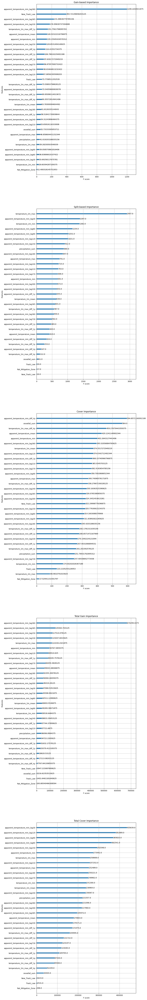

In [39]:
FEATURES = ['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean',
       'apparent_temperature_max', 'apparent_temperature_min',
       'apparent_temperature_mean', 'precipitation_sum', 'snowfall_sum',
       'apparent_temperature_min_lag30', 'apparent_temperature_min_lag60',
       'apparent_temperature_min_lag90', 'apparent_temperature_min_lag120',
       'apparent_temperature_min_lag150', 'apparent_temperature_min_lag180',
       'apparent_temperature_min_lag210', 'apparent_temperature_min_lag240',
       'apparent_temperature_min_lag270', 'apparent_temperature_min_lag300',
       'apparent_temperature_min_lag330', 'apparent_temperature_min_lag360',
       'apparent_temperature_min_lag365', 'apparent_temperature_min_lag730',
       'Trash_Law', 'New_Trash_Law', 'Rat_Mitigation_Zone', 
       'apparent_temperature_min_diff_1y', 'temperature_2m_max_diff_1y',
       'apparent_temperature_min_diff_2y', 'temperature_2m_max_diff_2y',
       'apparent_temperature_min_diff_3y', 'temperature_2m_max_diff_3y',
       'apparent_temperature_min_diff_4y', 'temperature_2m_max_diff_4y']

params = {'objective': 'reg:squarederror',
         'eval_metric': 'rmse',
         'booster': 'gbtree',
         'base_score': 0.5, 
         'n_estimators': 5000, 
        #  'min_child_weight': 6, 
        # 'learning_rate': 0.001,a
        # 'max_depth': 6, 
        # 'subsample': 1,
        # 'colsample_bytree': 0.96,
        # 'colsample_bylevel': 0.6, 
        # 'colsample_bynode': 0.9, 
        # 'reg_alpha': 2.2, 
        # 'gamma': 100, 
        # 'reg_lambda': 0.18,
        #  'early_stopping_rounds': 100, 
        }

# print(FEATURES)
# print(params)
TARGET = 'y'

# Gotta make sure the features and parameters exist.

xgb_model = xgb.XGBRegressor(**params)
xgb_model.fit(rs[FEATURES],rs[TARGET])

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(10, 100))
plot_importance(xgb_model, ax=ax1, importance_type='gain')
ax1.set_title('Gain-based Importance', fontsize=12)

plot_importance(xgb_model, ax=ax2, importance_type='weight')
ax2.set_title('Split-based Importance', fontsize=12)

plot_importance(xgb_model, ax=ax3, importance_type='cover')
ax3.set_title('Cover Importance', fontsize=12)

plot_importance(xgb_model, ax=ax4, importance_type='total_gain')
ax4.set_title('Total Gain Importance', fontsize=12)

plot_importance(xgb_model, ax=ax5, importance_type='total_cover')
ax5.set_title('Total Cover Importance', fontsize=12)

## Trial 6

Text(0.5, 1.0, 'Total Cover Importance')

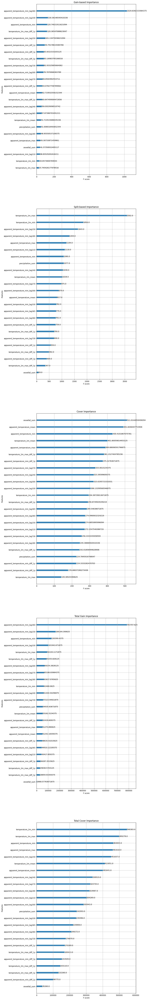

In [40]:
FEATURES = ['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean',
       'apparent_temperature_max', 'apparent_temperature_min',
       'apparent_temperature_mean', 'precipitation_sum', 'snowfall_sum',
       'apparent_temperature_min_lag150', 'apparent_temperature_min_lag180',
       'apparent_temperature_min_lag210', 'apparent_temperature_min_lag240',
       'apparent_temperature_min_lag270', 'apparent_temperature_min_lag300',
       'apparent_temperature_min_lag330', 'apparent_temperature_min_lag360',
       'apparent_temperature_min_lag365', 'apparent_temperature_min_lag730',
       'apparent_temperature_min_diff_1y', 'temperature_2m_max_diff_1y',
       'apparent_temperature_min_diff_2y', 'temperature_2m_max_diff_2y',
       'apparent_temperature_min_diff_3y', 'temperature_2m_max_diff_3y',]

params = {'objective': 'reg:squarederror',
         'eval_metric': 'rmse',
         'booster': 'gbtree',
         'base_score': 0.5, 
         'n_estimators': 5000, 
        #  'min_child_weight': 6, 
        # 'learning_rate': 0.001,a
        # 'max_depth': 6, 
        # 'subsample': 1,
        # 'colsample_bytree': 0.96,
        # 'colsample_bylevel': 0.6, 
        # 'colsample_bynode': 0.9, 
        # 'reg_alpha': 2.2, 
        # 'gamma': 100, 
        # 'reg_lambda': 0.18,
        #  'early_stopping_rounds': 100, 
        }

# print(FEATURES)
# print(params)
TARGET = 'y'

# Gotta make sure the features and parameters exist.

xgb_model = xgb.XGBRegressor(**params)
xgb_model.fit(rs[FEATURES],rs[TARGET])

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(10, 100))
plot_importance(xgb_model, ax=ax1, importance_type='gain')
ax1.set_title('Gain-based Importance', fontsize=12)

plot_importance(xgb_model, ax=ax2, importance_type='weight')
ax2.set_title('Split-based Importance', fontsize=12)

plot_importance(xgb_model, ax=ax3, importance_type='cover')
ax3.set_title('Cover Importance', fontsize=12)

plot_importance(xgb_model, ax=ax4, importance_type='total_gain')
ax4.set_title('Total Gain Importance', fontsize=12)

plot_importance(xgb_model, ax=ax5, importance_type='total_cover')
ax5.set_title('Total Cover Importance', fontsize=12)

# Conclusions

We see consistently  that the apparent temperature minimum and apparent temperature maximums play a major role in XGBoost's Gain Plots. We also see that the amount of Snowfall also plays a role especially in Trial 6. For our NeuralProphet models, we will use apparent temperature max, apparent temperature min, and snowfall as regressed features. Holidays are not considered here but we holidays are already handled well by NeuralProphet and Prophet.